1/1 [==============================] - 0s 149ms/step


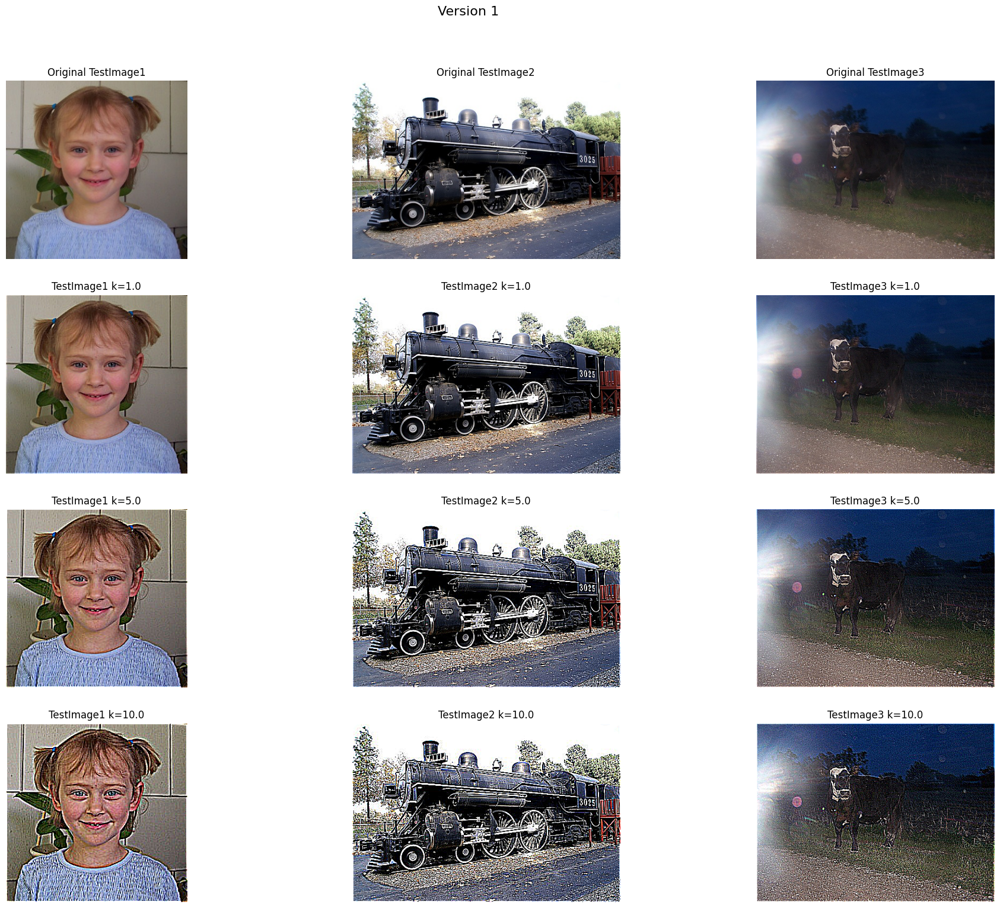

In [ ]:
import os
import keras
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Set the backend for Keras
os.environ["KERAS_BACKEND"] = "tensorflow"

# Custom initializer function
def custom_initializer(shape, dtype=None):
    return keras.backend.constant(0.04, shape=shape, dtype=dtype)

# Function to build the model using DepthwiseConv2D
def build_model_using_depthwiseConv2D():
    ins = keras.layers.Input(shape=(None, None, 3), name="Input")
    k = keras.layers.Input(shape=(1,), name="k")

    # DepthwiseConv2D with custom initializer
    x1 = keras.layers.DepthwiseConv2D((5, 5), depthwise_initializer=custom_initializer,use_bias=False, padding='same',
                                      activation='linear', name="GaussianBlur")(ins)
    outs = ins + k * (ins - x1)
    model = keras.Model(inputs=[ins, k], outputs=outs, name="Version1")
    model.trainable = False
    return model

# Build the model
model = build_model_using_depthwiseConv2D()

# Function to apply the model with different k values
def apply_blur_with_k(image, k_value):
    # Predict using the model and ensure the input has a batch dimension
    a = model.predict([image[np.newaxis, :, :, [2, 1, 0]], np.array([[k_value]])])
    return a[0]  # Take the first (and only) batch element

# Read the images
img1 = cv2.imread("TestImage1.jpg")
img2 = cv2.imread("TestImage2.jpg")
img3 = cv2.imread("TestImage3.jpg")

# Apply the model with k=1, k=5, k=10 for each image
blurred_img1_k1 = apply_blur_with_k(img1, 1)
blurred_img2_k1 = apply_blur_with_k(img2, 1)
blurred_img3_k1 = apply_blur_with_k(img3, 1)

blurred_img1_k5 = apply_blur_with_k(img1, 5)
blurred_img2_k5 = apply_blur_with_k(img2, 5)
blurred_img3_k5 = apply_blur_with_k(img3, 5)

blurred_img1_k10 = apply_blur_with_k(img1, 10)
blurred_img2_k10 = apply_blur_with_k(img2, 10)
blurred_img3_k10 = apply_blur_with_k(img3, 10)

# Display the original and blurred images with different k values for each image
plt.figure(figsize=(24, 18))

# Add a central title to the figure
plt.suptitle('Version 1', fontsize=16, y=0.95)

# Define a helper function to plot images
def plot_images(image, title, position):
    plt.subplot(4, 3, position)
    plt.imshow(np.clip(image, 0, 255).astype(np.uint8))
    plt.axis('off')
    plt.title(title)

# Plot the first row with all the original photos
plot_images(img1[:, :, [2, 1, 0]], 'Original TestImage1', 1)
plot_images(img2[:, :, [2, 1, 0]], 'Original TestImage2', 2)
plot_images(img3[:, :, [2, 1, 0]], 'Original TestImage3', 3)

# Plot the second row with k=1 for all test images
plot_images(blurred_img1_k1, 'TestImage1 k=1.0', 4)
plot_images(blurred_img2_k1, 'TestImage2 k=1.0', 5)
plot_images(blurred_img3_k1, 'TestImage3 k=1.0', 6)

# Plot the third row with k=5 for all test images
plot_images(blurred_img1_k5, 'TestImage1 k=5.0', 7)
plot_images(blurred_img2_k5, 'TestImage2 k=5.0', 8)
plot_images(blurred_img3_k5, 'TestImage3 k=5.0', 9)

# Plot the fourth row with k=10 for all test images
plot_images(blurred_img1_k10, 'TestImage1 k=10.0', 10)
plot_images(blurred_img2_k10, 'TestImage2 k=10.0', 11)
plot_images(blurred_img3_k10, 'TestImage3 k=10.0', 12)

plt.show()


1/1 [==============================] - 0s 55ms/step


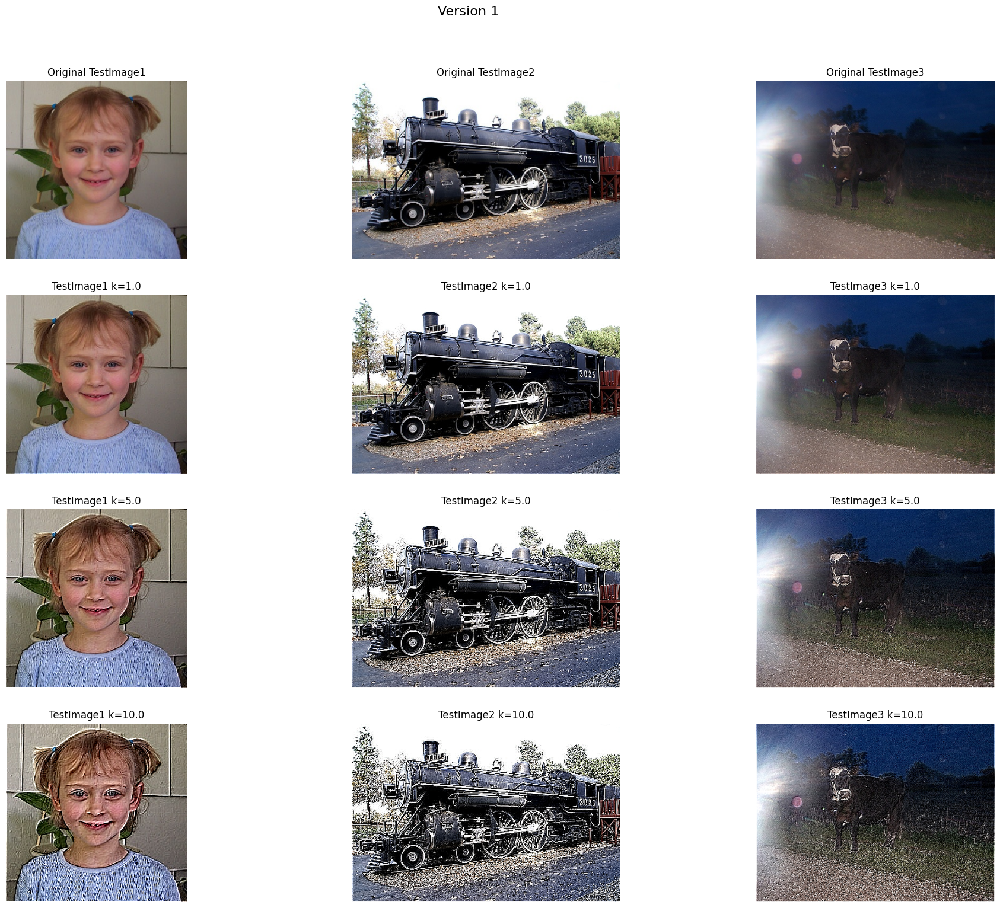

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras

# Set the backend for Keras
os.environ["KERAS_BACKEND"] = "tensorflow"

# Custom initializer function for Gaussian blur
def gaussian_blur_initializer(shape, dtype=tf.float32):
    kernel = np.array([[1, 4, 6],
                       [4, 16, 24],
                       [6, 24, 36]], dtype=np.float32)
    kernel = kernel / np.sum(kernel)
    kernel = kernel[:, :, np.newaxis, np.newaxis]  # Add dimensions to match the shape
    return kernel

# Custom initializer function for RGB to YUV conversion
def rgb_to_yuv_initializer(shape, dtype=None):
    # Standard conversion matrix from RGB to YUV
    return tf.constant([[ 0.300, -0.170, 0.500],
                        [ 0.600, -0.330, -0.420],
                        [ 0.115, 0.500, -0.080]], shape=shape, dtype=dtype)

# Custom initializer function for YUV to RGB conversion
def yuv_to_rgb_initializer(shape, dtype=None):
    # Perform YUV to RGB conversion
    return tf.constant([[ 1.0, 1.0, 1.0],
                        [ 0.0, -0.345, 1.780],
                        [ 1.400, -0.715 , 0.0]], shape=shape, dtype=dtype)

# Function to build the model
def build_model():
    # Input layers
    ins = keras.layers.Input(shape=(None, None, 3), name="Input")
    k = keras.layers.Input(shape=(1,), name="k")

    # RGB to YUV conversion
    x = keras.layers.Conv2D(3, (1, 1), kernel_initializer=rgb_to_yuv_initializer, padding="same", use_bias=False, name="RGB2YUV")(ins)

    # Gaussian blur on the Y channel
    x1 = keras.layers.Conv2D(1, (3, 3), kernel_initializer=gaussian_blur_initializer, use_bias=False, padding='same', name="GaussianBlur")(x[..., :1])

    # Combine the original Y channel with the blurred version
    x = keras.layers.Concatenate()([x[..., :1] + (x[..., :1] - x1) * k, x[..., 1:]])

    # YUV to RGB conversion
    outs = keras.layers.Conv2D(3, (1, 1), kernel_initializer=yuv_to_rgb_initializer, padding="same", use_bias=False, name="YUV2RGB")(x)

    # Build the model
    model = keras.Model(inputs=[ins, k], outputs=outs, name="Version2")
    model.trainable = False
    return model

# Example usage:
model = build_model()

# Function to apply the model with different k values
def apply_blur_with_k(image, k_value):
    # Predict using the model and ensure the input has a batch dimension
    a = model.predict([image[np.newaxis, :, :, [2, 1, 0]], np.array([[k_value]])])
    return a[0]  # Take the first (and only) batch element

# Read the images
img1 = cv2.imread("TestImage1.jpg")
img2 = cv2.imread("TestImage2.jpg")
img3 = cv2.imread("TestImage3.jpg")

# Apply the model with k=1, k=5, k=10 for each image
blurred_img1_k1 = apply_blur_with_k(img1, 1)
blurred_img2_k1 = apply_blur_with_k(img2, 1)
blurred_img3_k1 = apply_blur_with_k(img3, 1)

blurred_img1_k5 = apply_blur_with_k(img1, 5)
blurred_img2_k5 = apply_blur_with_k(img2, 5)
blurred_img3_k5 = apply_blur_with_k(img3, 5)

blurred_img1_k10 = apply_blur_with_k(img1, 10)
blurred_img2_k10 = apply_blur_with_k(img2, 10)
blurred_img3_k10 = apply_blur_with_k(img3, 10)

# Display the original and blurred images with different k values for each image
plt.figure(figsize=(24, 18))

# Add a central title to the figure
plt.suptitle('Version 2', fontsize=16, y=0.95)

# Define a helper function to plot images
def plot_images(image, title, position):
    plt.subplot(4, 3, position)
    plt.imshow(np.clip(image, 0, 255).astype(np.uint8))
    plt.axis('off')
    plt.title(title)

# Plot the first row with all the original photos
plot_images(img1[:, :, [2, 1, 0]], 'Original TestImage1', 1)
plot_images(img2[:, :, [2, 1, 0]], 'Original TestImage2', 2)
plot_images(img3[:, :, [2, 1, 0]], 'Original TestImage3', 3)

# Plot the second row with k=1 for all test images
plot_images(blurred_img1_k1, 'TestImage1 k=1.0', 4)
plot_images(blurred_img2_k1, 'TestImage2 k=1.0', 5)
plot_images(blurred_img3_k1, 'TestImage3 k=1.0', 6)

# Plot the third row with k=5 for all test images
plot_images(blurred_img1_k5, 'TestImage1 k=5.0', 7)
plot_images(blurred_img2_k5, 'TestImage2 k=5.0', 8)
plot_images(blurred_img3_k5, 'TestImage3 k=5.0', 9)

# Plot the fourth row with k=10 for all test images
plot_images(blurred_img1_k10, 'TestImage1 k=10.0', 10)
plot_images(blurred_img2_k10, 'TestImage2 k=10.0', 11)
plot_images(blurred_img3_k10, 'TestImage3 k=10.0', 12)

plt.show()

1/1 [==============================] - 0s 69ms/step


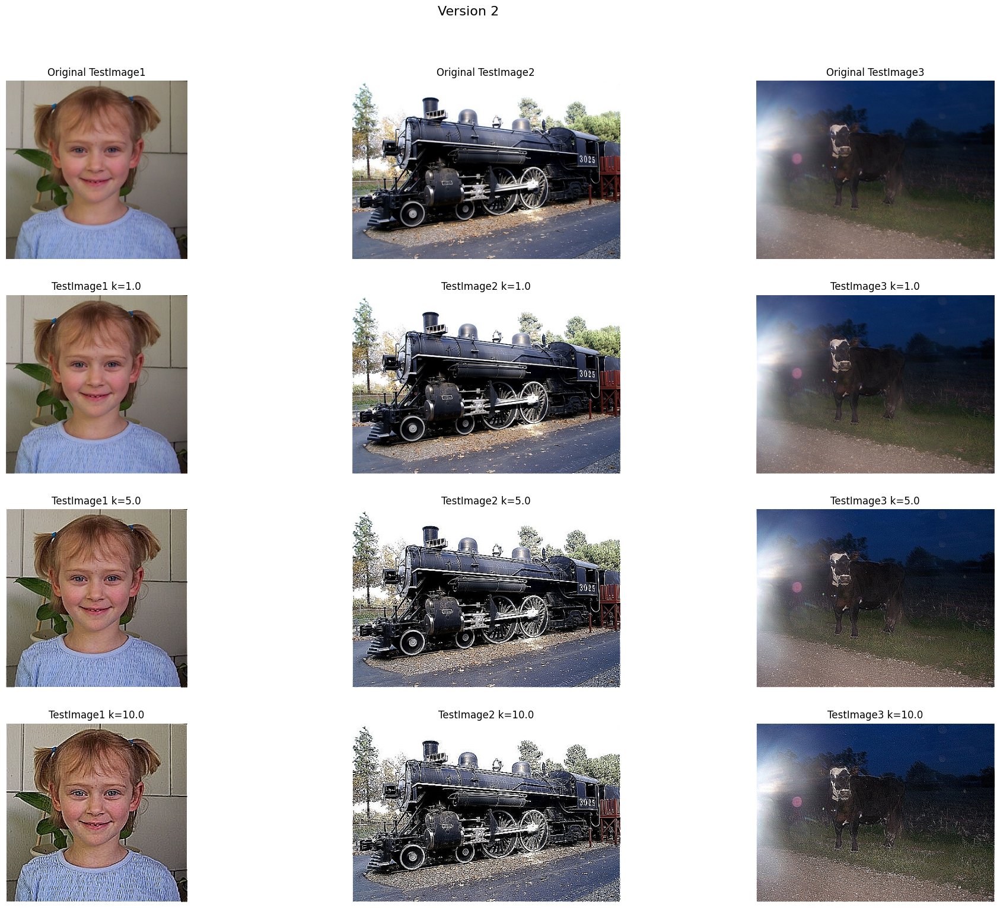

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras

# Set the backend for Keras
os.environ["KERAS_BACKEND"] = "tensorflow"

# Custom initializer function for Gaussian blur
def gaussian_blur_initializer(shape, dtype=None):
    # Convert the kernel values to a TensorFlow constant
    return tf.constant([[0.0625, 0.125, 0.0625],
                        [0.125, 0.25, 0.125],
                        [0.0625, 0.125, 0.0625]], shape=shape, dtype=dtype)

# Custom initializer function for RGB to YUV conversion
def rgb_to_yuv_initializer(shape, dtype=None):
    # Standard conversion matrix from RGB to YUV
    return tf.constant([[ 0.300, -0.170, 0.500],
                        [ 0.600, -0.330, -0.420],
                        [ 0.115, 0.500, -0.080]], shape=shape, dtype=dtype)

# Custom initializer function for YUV to RGB conversion
def yuv_to_rgb_initializer(shape, dtype=None):
    # Standard conversion matrix from YUV to RGB
    return tf.constant([[ 1.0, 1.0, 1.0],
                        [ 0.0, -0.345, 1.780],
                        [ 1.400, -0.715 , 0.0]], shape=shape, dtype=dtype)

# Function to build the model
def build_model():
    ins = keras.layers.Input(shape=(None, None, 3), name="Input")
    k = keras.layers.Input(shape=(1,), name="k")

    # Convert from the RGB color space to the YUV color space
    x = keras.layers.Conv2D(3, (1, 1), kernel_initializer=rgb_to_yuv_initializer, padding="same", use_bias=False, name="RGB2YUV")(ins)

    # Apply Gaussian blur on the Y channel using the custom initializer
    x1 = keras.layers.Conv2D(1, (3, 3), kernel_initializer=gaussian_blur_initializer, use_bias=False, padding='same', name="GaussianBlur")(x[..., :1])

    # Combine the original Y channel with the blurred version
    x = keras.layers.Concatenate()([x[..., :1] + (x[..., :1] - x1) * k, x[..., 1:]])

    # Convert from the YUV color space to the RGB color space
    outs = keras.layers.Conv2D(3, (1, 1), kernel_initializer=yuv_to_rgb_initializer, padding="same", use_bias=False, name="YUV2RGB")(x)

    model = keras.Model(inputs=[ins, k], outputs=outs, name="Version2")
    model.trainable = False
    return model

# Example usage:
model = build_model()

# Function to apply the model with different k values
def apply_blur_with_k(image, k_value):
    # Predict using the model and ensure the input has a batch dimension
    a = model.predict([image[np.newaxis, :, :, [2, 1, 0]], np.array([[k_value]])])
    return a[0]  # Take the first (and only) batch element

# Read the images
img1 = cv2.imread("TestImage1.jpg")
img2 = cv2.imread("TestImage2.jpg")
img3 = cv2.imread("TestImage3.jpg")

# Apply the model with k=1, k=5, k=10 for each image
blurred_img1_k1 = apply_blur_with_k(img1, 1)
blurred_img2_k1 = apply_blur_with_k(img2, 1)
blurred_img3_k1 = apply_blur_with_k(img3, 1)

blurred_img1_k5 = apply_blur_with_k(img1, 5)
blurred_img2_k5 = apply_blur_with_k(img2, 5)
blurred_img3_k5 = apply_blur_with_k(img3, 5)

blurred_img1_k10 = apply_blur_with_k(img1, 10)
blurred_img2_k10 = apply_blur_with_k(img2, 10)
blurred_img3_k10 = apply_blur_with_k(img3, 10)

# Display the original and blurred images with different k values for each image
plt.figure(figsize=(24, 18))

# Add a central title to the figure
plt.suptitle('Version 2', fontsize=16, y=0.95)

# Define a helper function to plot images
def plot_images(image, title, position):
    plt.subplot(4, 3, position)
    plt.imshow(np.clip(image, 0, 255).astype(np.uint8))
    plt.axis('off')
    plt.title(title)

# Plot the first row with all the original photos
plot_images(img1[:, :, [2, 1, 0]], 'Original TestImage1', 1)
plot_images(img2[:, :, [2, 1, 0]], 'Original TestImage2', 2)
plot_images(img3[:, :, [2, 1, 0]], 'Original TestImage3', 3)

# Plot the second row with k=1 for all test images
plot_images(blurred_img1_k1, 'TestImage1 k=1.0', 4)
plot_images(blurred_img2_k1, 'TestImage2 k=1.0', 5)
plot_images(blurred_img3_k1, 'TestImage3 k=1.0', 6)

# Plot the third row with k=5 for all test images
plot_images(blurred_img1_k5, 'TestImage1 k=5.0', 7)
plot_images(blurred_img2_k5, 'TestImage2 k=5.0', 8)
plot_images(blurred_img3_k5, 'TestImage3 k=5.0', 9)

# Plot the fourth row with k=10 for all test images
plot_images(blurred_img1_k10, 'TestImage1 k=10.0', 10)
plot_images(blurred_img2_k10, 'TestImage2 k=10.0', 11)
plot_images(blurred_img3_k10, 'TestImage3 k=10.0', 12)

plt.show()